# Agrupamento

In [1]:
pip install plotly --upgrade

  Attempting uninstall: plotly
    Found existing installation: plotly 5.10.0
    Uninstalling plotly-5.10.0:
      Successfully uninstalled plotly-5.10.0
Note: you may need to restart the kernel to use updated packages.


In [2]:
import plotly.express as px
import plotly.graph_objects as go
import numpy as np
from sklearn.preprocessing import StandardScaler

# K-means

## Base idade e salário

In [3]:
from sklearn.cluster import KMeans

In [4]:
x=[20,  27,  21,  37,  46, 53, 55,  47,  52,  32,  39,  41,  39,  48,  48]  
y=[1000,1200,2900,1850,900,950,2000,2100,3000,5900,4100,5100,7000,5000,6500]  

In [5]:
grafico = px.scatter(x=x, y=y)
grafico.show()

In [6]:
base_salario = np.array([[20,1000],[27,1200],[21,2900],[37,1850],[46,900],
                        [53,950],[55,2000],[47,2100],[52,3000],[32,5900],
                        [39,4100],[41,5100],[39,7000],[48,5000],[48,6500]])

In [7]:
base_salario

array([[  20, 1000],
       [  27, 1200],
       [  21, 2900],
       [  37, 1850],
       [  46,  900],
       [  53,  950],
       [  55, 2000],
       [  47, 2100],
       [  52, 3000],
       [  32, 5900],
       [  39, 4100],
       [  41, 5100],
       [  39, 7000],
       [  48, 5000],
       [  48, 6500]])

In [8]:
scaler_salario = StandardScaler()
base_salario = scaler_salario.fit_transform(base_salario)

In [9]:
base_salario

array([[-1.87963884, -1.11413572],
       [-1.23255006, -1.01725435],
       [-1.78719758, -0.19376273],
       [-0.30813751, -0.70238991],
       [ 0.52383377, -1.1625764 ],
       [ 1.17092255, -1.13835606],
       [ 1.35580506, -0.62972888],
       [ 0.61627503, -0.5812882 ],
       [ 1.0784813 , -0.14532205],
       [-0.77034379,  1.25945777],
       [-0.12325501,  0.38752547],
       [ 0.0616275 ,  0.8719323 ],
       [-0.12325501,  1.79230528],
       [ 0.70871628,  0.82349162],
       [ 0.70871628,  1.55010187]])

In [10]:
kmeans_salario = KMeans(n_clusters=3)
kmeans_salario.fit(base_salario)

C:\Users\danie\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.



KMeans(n_clusters=3)

In [11]:
centroides = kmeans_salario.cluster_centers_
centroides

array([[ 0.73953003, -0.72661025],
       [-1.63312883, -0.77505093],
       [ 0.07703438,  1.11413572]])

In [12]:
scaler_salario.inverse_transform(centroides)

array([[  48.33333333, 1800.        ],
       [  22.66666667, 1700.        ],
       [  41.16666667, 5600.        ]])

In [13]:
rotulos = kmeans_salario.labels_
rotulos

array([1, 1, 1, 0, 0, 0, 0, 0, 0, 2, 2, 2, 2, 2, 2])

In [14]:
grafico1 = px.scatter(x=base_salario[:,0], y=base_salario[:,1], color=rotulos)
grafico2 = px.scatter(x=centroides[:,0], y=centroides[:,1], size=[12,12,12])
grafico3 = go.Figure(data=grafico1.data + grafico2.data)
grafico3.show()

In [15]:
base_salario = scaler_salario.inverse_transform(base_salario)
centroides = scaler_salario.inverse_transform(centroides)
grafico1 = px.scatter(x=base_salario[:,0], y=base_salario[:,1], color=rotulos)
grafico2 = px.scatter(x=centroides[:,0], y=centroides[:,1], size=[12,12,12])
grafico3 = go.Figure(data=grafico1.data + grafico2.data)
grafico3.show()

## Dados randômicos

In [16]:
from sklearn.datasets import make_blobs

In [17]:
X_random, y_random = make_blobs(n_samples=200, centers=5, random_state=1)

In [18]:
X_random

array([[-1.96576392e+00,  5.23446451e+00],
       [-5.16022348e+00, -7.04217141e+00],
       [-6.17937069e+00, -2.16733539e+00],
       [-7.39138168e+00, -9.49590389e+00],
       [-6.38481234e+00, -8.47302970e+00],
       [-6.26144310e+00, -3.78347905e+00],
       [-2.04278768e+00,  3.07660864e-01],
       [-4.46426086e+00, -4.39451238e+00],
       [-6.40386190e+00, -6.36106990e+00],
       [ 2.42271161e-04,  5.14853403e+00],
       [-5.99212006e+00, -3.91488289e+00],
       [-6.46137477e+00, -3.14560994e+00],
       [-4.10185174e+00, -1.16625450e+00],
       [-1.01341572e+01, -4.07240274e+00],
       [-5.99004766e+00, -2.82631801e+00],
       [-1.14663009e+00,  4.10839703e+00],
       [-1.17104176e+00,  4.33091816e+00],
       [-9.19585147e+00, -3.90678125e+00],
       [-8.30173556e+00, -7.27738918e+00],
       [-7.56309575e+00, -8.46421308e+00],
       [-1.86845414e+00,  4.99311306e+00],
       [-4.22362233e+00, -2.50312346e+00],
       [-1.90838667e+00,  5.86113655e-01],
       [-6.

In [19]:
y_random

array([0, 2, 3, 2, 2, 3, 4, 3, 2, 0, 3, 3, 4, 1, 3, 0, 0, 1, 2, 2, 0, 3,
       4, 3, 4, 1, 2, 4, 4, 1, 2, 4, 0, 3, 2, 0, 1, 2, 1, 4, 2, 1, 4, 4,
       2, 4, 1, 3, 2, 0, 0, 3, 3, 0, 3, 1, 0, 4, 2, 2, 1, 3, 3, 3, 2, 0,
       0, 1, 4, 2, 1, 4, 2, 4, 4, 1, 2, 3, 0, 4, 1, 1, 3, 2, 3, 0, 2, 2,
       2, 1, 4, 3, 0, 4, 3, 1, 4, 0, 2, 1, 0, 2, 4, 1, 4, 2, 1, 2, 3, 0,
       3, 3, 2, 1, 3, 0, 1, 4, 0, 0, 2, 1, 1, 3, 0, 1, 2, 4, 2, 4, 0, 4,
       3, 3, 1, 1, 3, 0, 0, 3, 3, 3, 0, 0, 4, 2, 4, 0, 2, 3, 4, 3, 0, 4,
       3, 1, 1, 1, 0, 2, 4, 0, 1, 0, 4, 1, 1, 1, 3, 4, 1, 4, 4, 3, 0, 2,
       4, 3, 2, 0, 2, 0, 0, 2, 1, 4, 1, 0, 0, 3, 2, 4, 0, 1, 1, 4, 3, 4,
       2, 1])

In [20]:
grafico = px.scatter(x=X_random[:,0], y=X_random[:,1])
grafico.show()

In [21]:
kmeans_blobs = KMeans(n_clusters=5)
kmeans_blobs.fit(X_random)

C:\Users\danie\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.



KMeans(n_clusters=5)

In [22]:
rotulos = kmeans_blobs.predict(X_random)
rotulos

array([1, 2, 0, 2, 2, 0, 4, 0, 2, 1, 0, 0, 0, 3, 0, 1, 1, 3, 2, 2, 1, 0,
       4, 0, 4, 3, 2, 4, 4, 3, 2, 4, 1, 0, 2, 1, 3, 2, 3, 1, 3, 3, 4, 4,
       2, 4, 3, 0, 2, 4, 1, 0, 0, 1, 0, 3, 1, 0, 2, 2, 3, 0, 0, 0, 2, 4,
       1, 3, 4, 2, 3, 4, 2, 4, 4, 3, 2, 3, 1, 4, 3, 3, 0, 2, 0, 1, 2, 2,
       2, 3, 4, 0, 1, 4, 0, 3, 4, 1, 2, 3, 1, 2, 4, 3, 4, 2, 3, 2, 0, 1,
       0, 0, 2, 3, 0, 1, 3, 4, 1, 1, 2, 3, 3, 0, 1, 3, 2, 4, 2, 4, 1, 4,
       0, 0, 3, 3, 0, 1, 1, 0, 0, 0, 1, 1, 4, 2, 4, 1, 2, 0, 4, 0, 1, 4,
       0, 3, 3, 3, 1, 2, 4, 1, 3, 1, 4, 3, 3, 3, 0, 4, 3, 4, 4, 0, 1, 2,
       4, 0, 2, 1, 2, 1, 1, 2, 3, 4, 3, 1, 1, 0, 2, 4, 1, 3, 3, 4, 0, 4,
       2, 3])

In [23]:
centroides = kmeans_blobs.cluster_centers_
centroides

array([[-5.90368078, -3.04489641],
       [-1.58338528,  4.50520457],
       [-6.87958999, -8.11648104],
       [-9.85620522, -3.91021738],
       [-2.17069756,  1.02591979]])

In [24]:
grafico1 = px.scatter(x=X_random[:,0], y=X_random[:,1], color=rotulos)
grafico2 = px.scatter(x=centroides[:,0], y=centroides[:,1], size=[5,5,5,5,5])
grafico3 = go.Figure(data=grafico1.data + grafico2.data)
grafico3.show()

## Base de dados cartão de crédito - 1 atributo

- Fonte: https://archive.ics.uci.edu/ml/datasets/default+of+credit+card+clients

In [25]:
import pandas as pd
base_cartao = pd.read_csv('credit_card_clients.csv', header=1)
base_cartao

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,1,20000,2,2,1,24,2,2,-1,-1,...,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,-1,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,-1,0,-1,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,220000,1,3,1,39,0,0,0,0,...,88004,31237,15980,8500,20000,5003,3047,5000,1000,0
29996,29997,150000,1,3,2,43,-1,-1,-1,-1,...,8979,5190,0,1837,3526,8998,129,0,0,0
29997,29998,30000,1,2,2,37,4,3,2,-1,...,20878,20582,19357,0,0,22000,4200,2000,3100,1
29998,29999,80000,1,3,1,41,1,-1,0,0,...,52774,11855,48944,85900,3409,1178,1926,52964,1804,1


In [26]:
base_cartao['BILL_TOTAL'] = base_cartao['BILL_AMT1'] + base_cartao['BILL_AMT2'] + base_cartao['BILL_AMT3'] + base_cartao['BILL_AMT4'] + base_cartao['BILL_AMT5'] + base_cartao['BILL_AMT6']

In [27]:
base_cartao

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month,BILL_TOTAL
0,1,20000,2,2,1,24,2,2,-1,-1,...,0,0,0,689,0,0,0,0,1,7704
1,2,120000,2,2,2,26,-1,2,0,0,...,3455,3261,0,1000,1000,1000,0,2000,1,17077
2,3,90000,2,2,2,34,0,0,0,0,...,14948,15549,1518,1500,1000,1000,1000,5000,0,101653
3,4,50000,2,2,1,37,0,0,0,0,...,28959,29547,2000,2019,1200,1100,1069,1000,0,231334
4,5,50000,1,2,1,57,-1,0,-1,0,...,19146,19131,2000,36681,10000,9000,689,679,0,109339
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,220000,1,3,1,39,0,0,0,0,...,31237,15980,8500,20000,5003,3047,5000,1000,0,725349
29996,29997,150000,1,3,2,43,-1,-1,-1,-1,...,5190,0,1837,3526,8998,129,0,0,0,21182
29997,29998,30000,1,2,2,37,4,3,2,-1,...,20582,19357,0,0,22000,4200,2000,3100,1,70496
29998,29999,80000,1,3,1,41,1,-1,0,0,...,11855,48944,85900,3409,1178,1926,52964,1804,1,266611


In [28]:
X_cartao = base_cartao.iloc[:, [1, 25]].values
X_cartao

array([[ 20000,   7704],
       [120000,  17077],
       [ 90000, 101653],
       ...,
       [ 30000,  70496],
       [ 80000, 266611],
       [ 50000, 230874]], dtype=int64)

In [29]:
scaler_cartao = StandardScaler()
X_cartao = scaler_cartao.fit_transform(X_cartao)

In [30]:
X_cartao

array([[-1.13672015, -0.69069198],
       [-0.3659805 , -0.66599747],
       [-0.59720239, -0.44316987],
       ...,
       [-1.05964618, -0.52525745],
       [-0.67427636, -0.00856436],
       [-0.90549825, -0.10271861]])

In [31]:
wcss = []
for i in range(1, 11):
    kmeans_cartao = KMeans(n_clusters=i, random_state=0)
    kmeans_cartao.fit(X_cartao)
    wcss.append(kmeans_cartao.inertia_)

In [32]:
wcss

[60000.00000000003,
 35196.57080583446,
 20128.13255834767,
 14943.80917386596,
 10707.537016753666,
 8603.395384848947,
 7400.069599689454,
 6353.473303353447,
 5665.82385774019,
 5052.188166408732]

In [33]:
grafico = px.line(x=range(1,11), y=wcss)
grafico.show()

In [34]:
kmeans_cartao = KMeans(n_clusters=4, random_state=0)
rotulos = kmeans_cartao.fit_predict(X_cartao)

In [35]:
grafico = px.scatter(x=X_cartao[:,0], y=X_cartao[:,1], color=rotulos)
grafico.show()

In [36]:
lista_clientes = np.column_stack((base_cartao, rotulos))
lista_clientes

array([[     1,  20000,      2, ...,      1,   7704,      0],
       [     2, 120000,      2, ...,      1,  17077,      0],
       [     3,  90000,      2, ...,      0, 101653,      0],
       ...,
       [ 29998,  30000,      1, ...,      1,  70496,      0],
       [ 29999,  80000,      1, ...,      1, 266611,      0],
       [ 30000,  50000,      1, ...,      1, 230874,      0]], dtype=int64)

In [37]:
lista_clientes = lista_clientes[lista_clientes[:,26].argsort()]
lista_clientes

array([[     1,  20000,      2, ...,      1,   7704,      0],
       [ 16789,  30000,      1, ...,      1,  14274,      0],
       [ 16788,  30000,      1, ...,      1,  90453,      0],
       ...,
       [ 20882, 110000,      1, ...,      0, 554308,      3],
       [ 20744, 220000,      1, ...,      0, 452961,      3],
       [ 20270, 150000,      2, ...,      0, 546939,      3]], dtype=int64)

## Base de dados cartão de crédito - mais atributos

In [38]:
base_cartao.columns[[1,2,3,4,5,25]]

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'BILL_TOTAL'], dtype='object')

In [39]:
X_cartao_mais = base_cartao.iloc[:, [1,2,3,4,5,25]].values
X_cartao_mais

array([[ 20000,      2,      2,      1,     24,   7704],
       [120000,      2,      2,      2,     26,  17077],
       [ 90000,      2,      2,      2,     34, 101653],
       ...,
       [ 30000,      1,      2,      2,     37,  70496],
       [ 80000,      1,      3,      1,     41, 266611],
       [ 50000,      1,      2,      1,     46, 230874]], dtype=int64)

In [40]:
scaler_cartao_mais = StandardScaler()
X_cartao_mais = scaler_cartao_mais.fit_transform(X_cartao_mais)
X_cartao_mais

array([[-1.13672015,  0.81016074,  0.18582826, -1.05729503, -1.24601985,
        -0.69069198],
       [-0.3659805 ,  0.81016074,  0.18582826,  0.85855728, -1.02904717,
        -0.66599747],
       [-0.59720239,  0.81016074,  0.18582826,  0.85855728, -0.16115646,
        -0.44316987],
       ...,
       [-1.05964618, -1.23432296,  0.18582826,  0.85855728,  0.16430256,
        -0.52525745],
       [-0.67427636, -1.23432296,  1.45111372, -1.05729503,  0.59824792,
        -0.00856436],
       [-0.90549825, -1.23432296,  0.18582826, -1.05729503,  1.14067961,
        -0.10271861]])

In [41]:
X_cartao_mais = StandardScaler().fit_transform(X_cartao_mais)
X_cartao_mais

array([[-1.13672015,  0.81016074,  0.18582826, -1.05729503, -1.24601985,
        -0.69069198],
       [-0.3659805 ,  0.81016074,  0.18582826,  0.85855728, -1.02904717,
        -0.66599747],
       [-0.59720239,  0.81016074,  0.18582826,  0.85855728, -0.16115646,
        -0.44316987],
       ...,
       [-1.05964618, -1.23432296,  0.18582826,  0.85855728,  0.16430256,
        -0.52525745],
       [-0.67427636, -1.23432296,  1.45111372, -1.05729503,  0.59824792,
        -0.00856436],
       [-0.90549825, -1.23432296,  0.18582826, -1.05729503,  1.14067961,
        -0.10271861]])

In [42]:
wcss = []
for i in range(1,11):
    kmeans_cartao_mais = KMeans(n_clusters=i, random_state=0)
    kmeans_cartao_mais.fit(X_cartao_mais)
    wcss.append(kmeans_cartao_mais.inertia_)

In [43]:
grafico = px.line(x = range(1,11), y = wcss)
grafico.show()

In [44]:
kmeans_cartao_mais = KMeans(n_clusters=4, random_state=0)
rotulos = kmeans_cartao_mais.fit_predict(X_cartao_mais)
rotulos

array([1, 0, 0, ..., 3, 1, 1])

In [45]:
from sklearn.decomposition import PCA

In [46]:
pca = PCA(n_components=2)
X_cartao_mais_pca = pca.fit_transform(X_cartao_mais)
X_cartao_mais_pca.shape, X_cartao_mais_pca

((30000, 2),
 array([[-0.74082054, -1.13671858],
        [-1.48027121, -0.30100547],
        [-0.94737386, -0.48666789],
        ...,
        [-0.79468657, -0.90012663],
        [ 1.17562376, -1.54746987],
        [ 1.13614987, -1.14039836]]))

In [47]:
grafico = px.scatter(x=X_cartao_mais_pca[:,0], y=X_cartao_mais_pca[:,1], color=rotulos)
grafico.show()

In [48]:
lista_clientes = np.column_stack((base_cartao, rotulos))
lista_clientes = lista_clientes[lista_clientes[:,26].argsort()]
lista_clientes

array([[ 22235, 250000,      2, ...,      0, 120233,      0],
       [  6902, 300000,      2, ...,      0, 605733,      0],
       [  6903, 180000,      2, ...,      0,  33111,      0],
       ...,
       [  7847,  30000,      1, ...,      1, 168918,      3],
       [  7866,  50000,      1, ...,      0, 132306,      3],
       [ 15000,  50000,      1, ...,      0, 249711,      3]], dtype=int64)

# Agrupamento hierárquico

## Base salário idade

In [49]:
base_salario

array([[  20., 1000.],
       [  27., 1200.],
       [  21., 2900.],
       [  37., 1850.],
       [  46.,  900.],
       [  53.,  950.],
       [  55., 2000.],
       [  47., 2100.],
       [  52., 3000.],
       [  32., 5900.],
       [  39., 4100.],
       [  41., 5100.],
       [  39., 7000.],
       [  48., 5000.],
       [  48., 6500.]])

In [50]:
grafico = px.scatter(x=base_salario[:,0], y=base_salario[:,1])
grafico.show()

In [51]:
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage

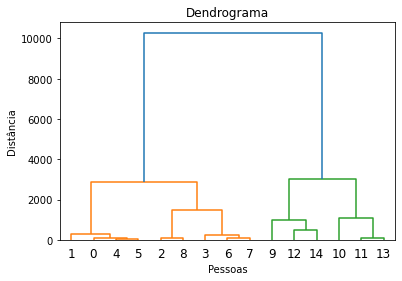

In [52]:
dendrograma = dendrogram(linkage(base_salario, method='ward'))
plt.title('Dendrograma')
plt.xlabel('Pessoas')
plt.ylabel('Distância');

In [53]:
from sklearn.cluster import AgglomerativeClustering

In [54]:
hc_salario = AgglomerativeClustering(n_clusters=3)
rotulos = hc_salario.fit_predict(base_salario)
rotulos

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 1, 1, 2, 1, 2], dtype=int64)

In [55]:
hc_salario = AgglomerativeClustering(n_clusters=3, linkage='ward', affinity='euclidean')
rotulos = hc_salario.fit_predict(base_salario)

In [56]:
#base_salario = scaler_salario.inverse_transform(base_salario)
grafico = px.scatter(x=base_salario[:,0], y=base_salario[:,1], color=rotulos)
grafico.show()

## Base cartão de crédito

In [57]:
X_cartao

array([[-1.13672015, -0.69069198],
       [-0.3659805 , -0.66599747],
       [-0.59720239, -0.44316987],
       ...,
       [-1.05964618, -0.52525745],
       [-0.67427636, -0.00856436],
       [-0.90549825, -0.10271861]])

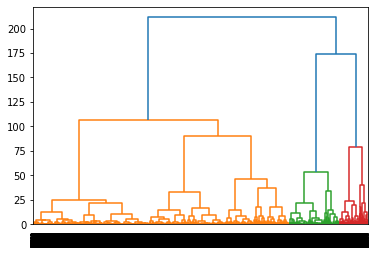

In [58]:
import time
start = time.time()
dendrograma = dendrogram(linkage(X_cartao, method='ward'))
end = time.time()

In [59]:
print(f'{end - start:.2f} segundos.')

77.86 segundos.


In [60]:
hc_cartao = AgglomerativeClustering(n_clusters=3)
rotulos = hc_cartao.fit_predict(X_cartao)
rotulos

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [61]:
grafico = px.scatter(x=X_cartao[:,0], y=X_cartao[:,1], color=rotulos)
grafico.show()

# DBSCAN

## Base salário idade

In [62]:
base_salario = scaler_salario.fit_transform(base_salario)
base_salario

array([[-1.87963884, -1.11413572],
       [-1.23255006, -1.01725435],
       [-1.78719758, -0.19376273],
       [-0.30813751, -0.70238991],
       [ 0.52383377, -1.1625764 ],
       [ 1.17092255, -1.13835606],
       [ 1.35580506, -0.62972888],
       [ 0.61627503, -0.5812882 ],
       [ 1.0784813 , -0.14532205],
       [-0.77034379,  1.25945777],
       [-0.12325501,  0.38752547],
       [ 0.0616275 ,  0.8719323 ],
       [-0.12325501,  1.79230528],
       [ 0.70871628,  0.82349162],
       [ 0.70871628,  1.55010187]])

In [63]:
from sklearn.cluster import DBSCAN

In [64]:
dbscan_salario = DBSCAN(eps=0.95, min_samples=2)
dbscan_salario.fit(base_salario)

DBSCAN(eps=0.95, min_samples=2)

In [65]:
rotulos = dbscan_salario.labels_
rotulos

array([0, 0, 0, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2], dtype=int64)

In [66]:
grafico = px.scatter(x=base_salario[:,0], y=base_salario[:,1], color=rotulos)
grafico.show()

## Base cartão de crédito

In [67]:
X_cartao

array([[-1.13672015, -0.69069198],
       [-0.3659805 , -0.66599747],
       [-0.59720239, -0.44316987],
       ...,
       [-1.05964618, -0.52525745],
       [-0.67427636, -0.00856436],
       [-0.90549825, -0.10271861]])

In [68]:
dbscan_cartao = DBSCAN(eps = 0.37)
rotulos = dbscan_cartao.fit_predict(X_cartao)
rotulos

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [69]:
np.unique(rotulos, return_counts=True)

(array([-1,  0,  1,  2], dtype=int64),
 array([   52, 29920,    18,    10], dtype=int64))

In [70]:
grafico = px.scatter(x=X_cartao[:,0], y=X_cartao[:,1], color=rotulos)
grafico.show()

# K-means x Hierárquico x DBSCAN

In [71]:
from sklearn import datasets

In [72]:
X_random, y_random = datasets.make_moons(n_samples=1500, noise=0.09)
X_random

array([[ 1.18764071,  0.17609807],
       [ 1.4013754 , -0.34596128],
       [ 1.48039108, -0.18787796],
       ...,
       [-0.9507194 ,  0.04721096],
       [ 0.72070872,  0.40140996],
       [ 0.4978899 ,  1.00944514]])

In [73]:
y_random

array([0, 1, 1, ..., 0, 0, 0], dtype=int64)

In [74]:
np.unique(y_random)

array([0, 1], dtype=int64)

In [75]:
grafico = px.scatter(x = X_random[:,0], y = X_random[:,1])
grafico.show()

In [76]:
kmeans = KMeans(n_clusters=2)
rotulos = kmeans.fit_predict(X_random)
grafico = px.scatter(x=X_random[:,0], y=X_random[:,1], color=rotulos)
grafico.show()

C:\Users\danie\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=6.



In [77]:
hc = AgglomerativeClustering()
rotulos = hc.fit_predict(X_random)
grafico = px.scatter(x = X_random[:,0], y = X_random[:,1], color=rotulos)
grafico.show()

In [78]:
dbscan = DBSCAN(eps=0.1)
rotulos = dbscan.fit_predict(X_random)
grafico = px.scatter(x=X_random[:,0], y=X_random[:,1], color=rotulos)
grafico.show()